In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import sklearn

Reading file from github raw

In [70]:
df = pd.read_csv('https://raw.githubusercontent.com/FlipRoboTechnologies/ML-Datasets/main/Red%20Wine/winequality-red.csv')

In [7]:
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [23]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1599 non-null   float64
 1   volatile acidity      1599 non-null   float64
 2   citric acid           1599 non-null   float64
 3   residual sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free sulfur dioxide   1599 non-null   float64
 6   total sulfur dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


In [24]:
df.isna().sum().sum()

0

In [35]:
for col in df.columns:
    print("Unique values in "+col+' :')
    print(df[col].unique().shape[0])
    print('\n')

Unique values in fixed acidity :
96


Unique values in volatile acidity :
143


Unique values in citric acid :
80


Unique values in residual sugar :
91


Unique values in chlorides :
153


Unique values in free sulfur dioxide :
60


Unique values in total sulfur dioxide :
144


Unique values in density :
436


Unique values in pH :
89


Unique values in sulphates :
96


Unique values in alcohol :
65


Unique values in quality :
6




In [36]:
for col in df.columns:
    print(col + ' : ' + str(df[col].isna().sum()))

fixed acidity : 0
volatile acidity : 0
citric acid : 0
residual sugar : 0
chlorides : 0
free sulfur dioxide : 0
total sulfur dioxide : 0
density : 0
pH : 0
sulphates : 0
alcohol : 0
quality : 0


In [16]:
for col in df.columns:
    print(col + ' : ' + str(df[col].dtype))

fixed acidity : float64
volatile acidity : float64
citric acid : float64
residual sugar : float64
chlorides : float64
free sulfur dioxide : float64
total sulfur dioxide : float64
density : float64
pH : float64
sulphates : float64
alcohol : float64
quality : int64


In [17]:
for col in df.columns:
    print(df[col].isna().value_counts())

fixed acidity
False    1599
Name: count, dtype: int64
volatile acidity
False    1599
Name: count, dtype: int64
citric acid
False    1599
Name: count, dtype: int64
residual sugar
False    1599
Name: count, dtype: int64
chlorides
False    1599
Name: count, dtype: int64
free sulfur dioxide
False    1599
Name: count, dtype: int64
total sulfur dioxide
False    1599
Name: count, dtype: int64
density
False    1599
Name: count, dtype: int64
pH
False    1599
Name: count, dtype: int64
sulphates
False    1599
Name: count, dtype: int64
alcohol
False    1599
Name: count, dtype: int64
quality
False    1599
Name: count, dtype: int64


<Axes: >

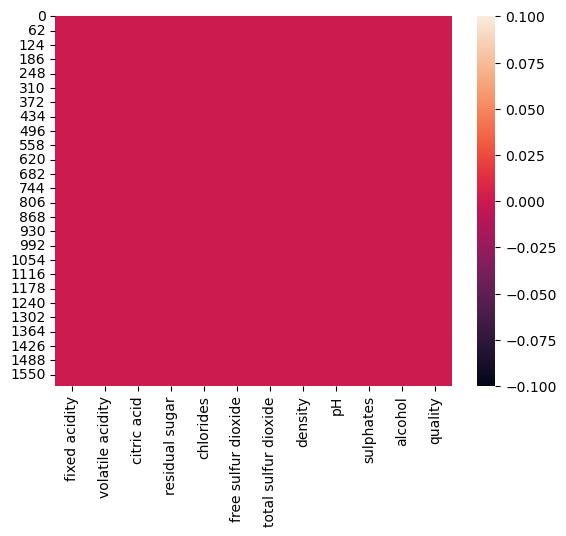

In [38]:
sns.heatmap(df.isna())

All the values are Integer or Float values as they are expected to be. No null values found. Data looks clean No need for preprocessing.Target variable is a categorical variable where quality >= 7, it's good, and quality < 7 it's bad. This is a classification problem. There are no categorical or string columns so no need for seperation


In [39]:
len(df)

1599

# Exploratory Data analysis

Checking columns and data informaiotn

In [41]:
desc_df = pd.DataFrame(df.describe())

In [42]:
desc_df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,8.319637,0.527821,0.270976,2.538806,0.087467,15.874922,46.467792,0.996747,3.311113,0.658149,10.422983,5.636023
std,1.741096,0.179060,0.194801,1.409928,0.047065,10.460157,32.895324,0.001887,0.154386,0.169507,1.065668,0.807569
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997835,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


<Axes: >

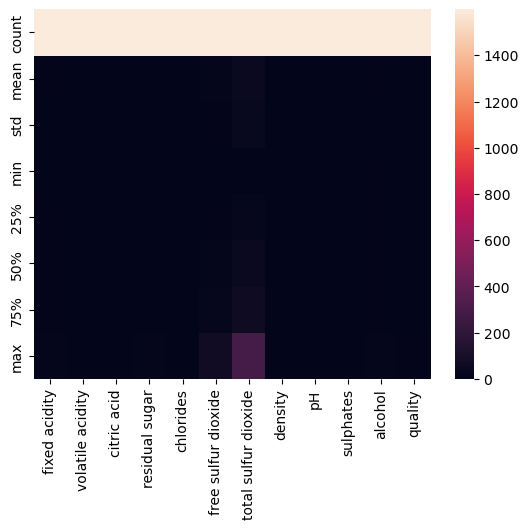

In [59]:
sns.heatmap(desc_df)

In [51]:
mean_gt = []
median_gt = []
mean_eq = []
for col in desc_df.columns:
    if desc_df.loc['mean',col] > desc_df.loc['50%',col]:
        mean_gt.append(col)
    elif desc_df.loc['50%',col] > desc_df.loc['mean',col]:
        median_gt.append(col)
    else:
        mean_eq.append(col)

In [52]:
mean_gt

['fixed acidity',
 'volatile acidity',
 'citric acid',
 'residual sugar',
 'chlorides',
 'free sulfur dioxide',
 'total sulfur dioxide',
 'pH',
 'sulphates',
 'alcohol']

In [53]:
median_gt

['density', 'quality']

In [54]:
mean_eq

[]

There are no negative or invalid values
    1. Mean is greater than median for fixed acidity, 

In [8]:
s = df.quality.value_counts()

In [10]:
type(s)

pandas.core.series.Series

<Axes: xlabel='quality', ylabel='count'>

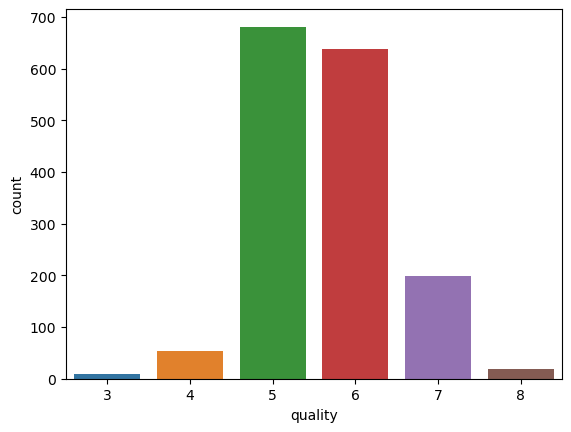

In [61]:
sns.countplot(x=df['quality'])

In [52]:
df.quality.unique()

array([5, 6, 7, 4, 8, 3], dtype=int64)

Observations so far
    1. quality of wines is not evenly distributed. It's more alligned towards center. We have to balance before training
    2. But as per problem statement, if quality is >=7 then only we will consider it as good. So we have very less amount of      information about quality is good.
    3. Also we don't have information for extremes like from 0,1,2 and 9,10. So when we train the algorithms, we have to take care that we handle those.
    

In [15]:
df.columns

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality'],
      dtype='object')

<Axes: xlabel='fixed acidity', ylabel='Count'>

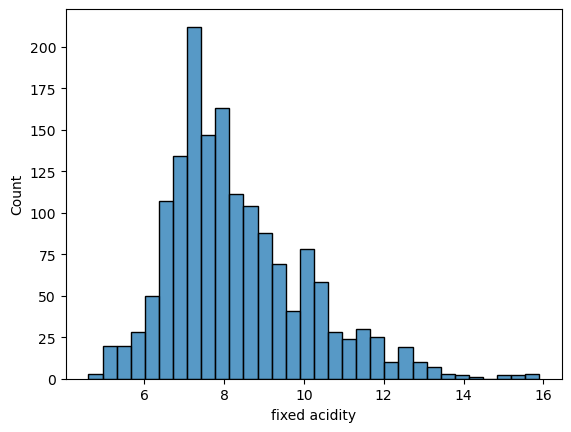

In [65]:
sns.histplot(x=df['fixed acidity'])

This looks like a normal distribution

<Axes: xlabel='volatile acidity', ylabel='Count'>

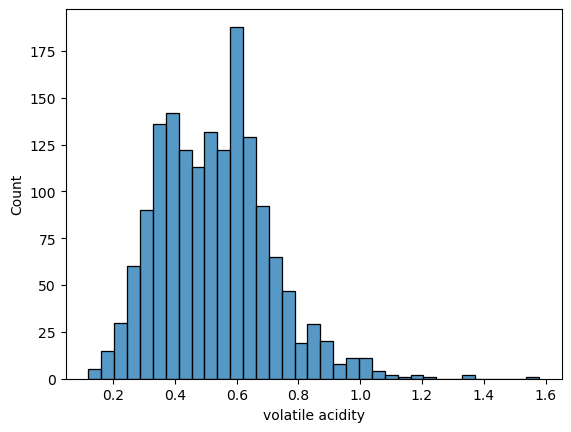

In [64]:
sns.histplot(x=df['volatile acidity'])

<Axes: xlabel='citric acid', ylabel='Count'>

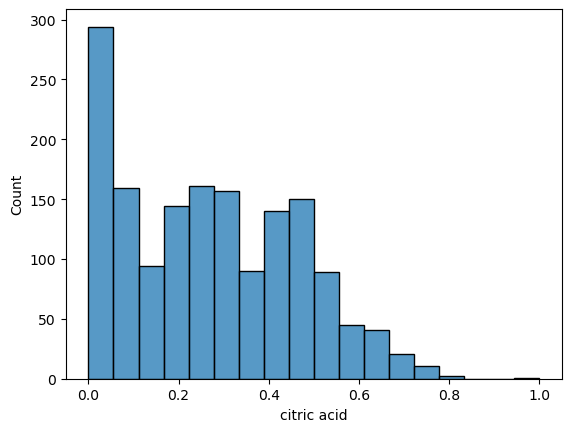

In [30]:
sns.histplot(df['citric acid'])

<Axes: xlabel='residual sugar', ylabel='Count'>

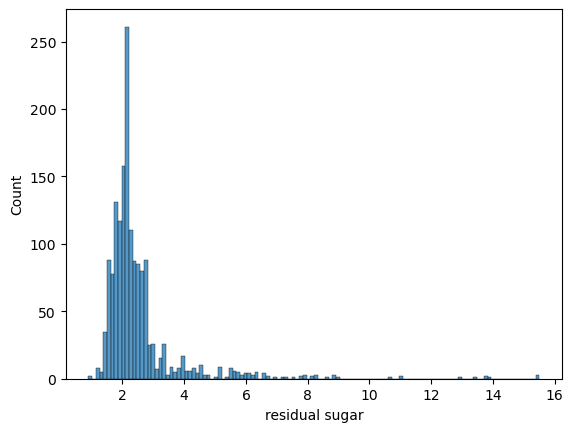

In [33]:
sns.histplot(df['residual sugar'])

<Axes: xlabel='chlorides', ylabel='Count'>

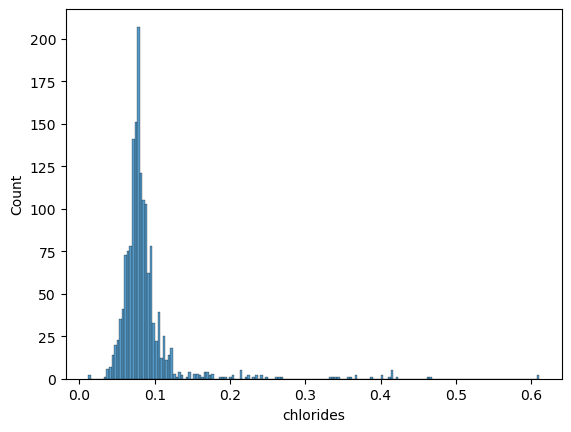

In [34]:
sns.histplot(df['chlorides'])

<Axes: xlabel='free sulfur dioxide', ylabel='Count'>

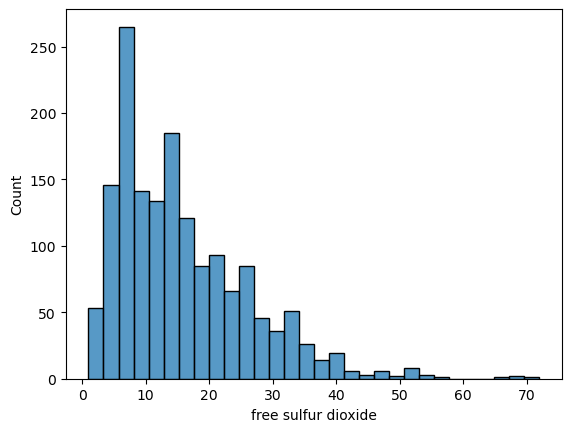

In [35]:
sns.histplot(df['free sulfur dioxide'])

<Axes: xlabel='total sulfur dioxide', ylabel='Count'>

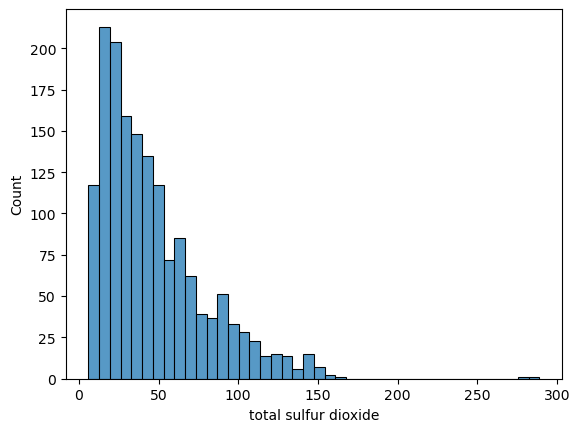

In [36]:
sns.histplot(df['total sulfur dioxide'])

<Axes: xlabel='density', ylabel='Count'>

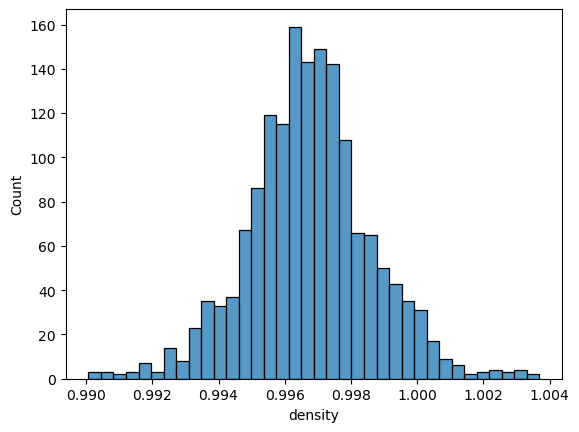

In [37]:
sns.histplot(df['density'])

<Axes: xlabel='pH', ylabel='Count'>

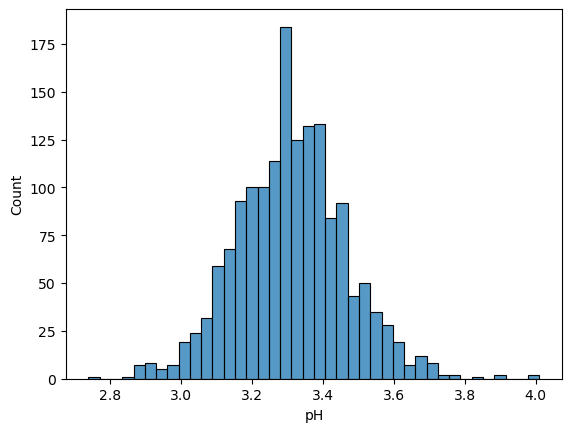

In [38]:
sns.histplot(df['pH'])

<Axes: xlabel='sulphates', ylabel='Count'>

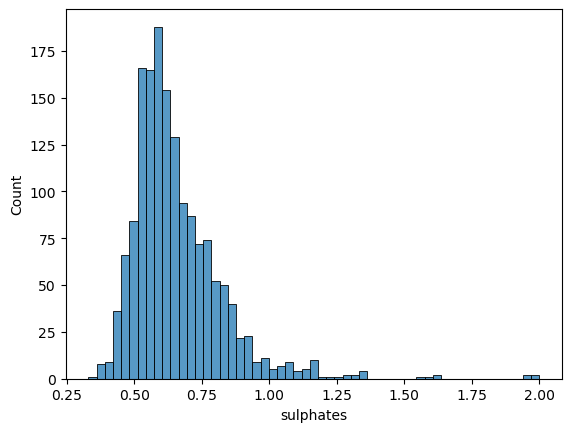

In [39]:
sns.histplot(df['sulphates'])

<Axes: xlabel='alcohol', ylabel='Count'>

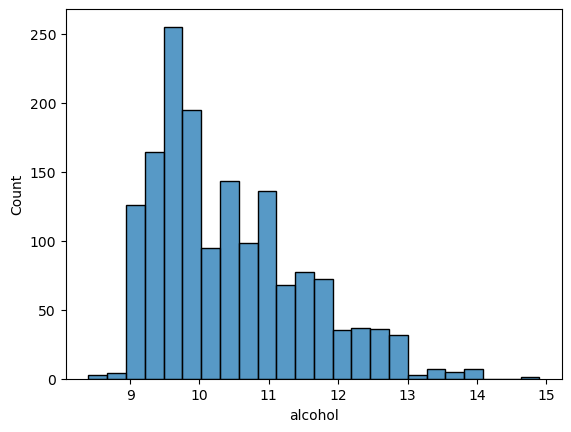

In [32]:
sns.histplot(df['alcohol'])

Most variables are left skewed. pH, Density are normally distributed align mostly with our target quality

C:\Users\LEELA DURGA PRASAD\AppData\Local\Temp\ipykernel_11012\1522175381.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[col],color='r')
C:\Users\LEELA DURGA PRASAD\AppData\Local\Temp\ipykernel_11012\1522175381.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[col],color='r')
C:\Use

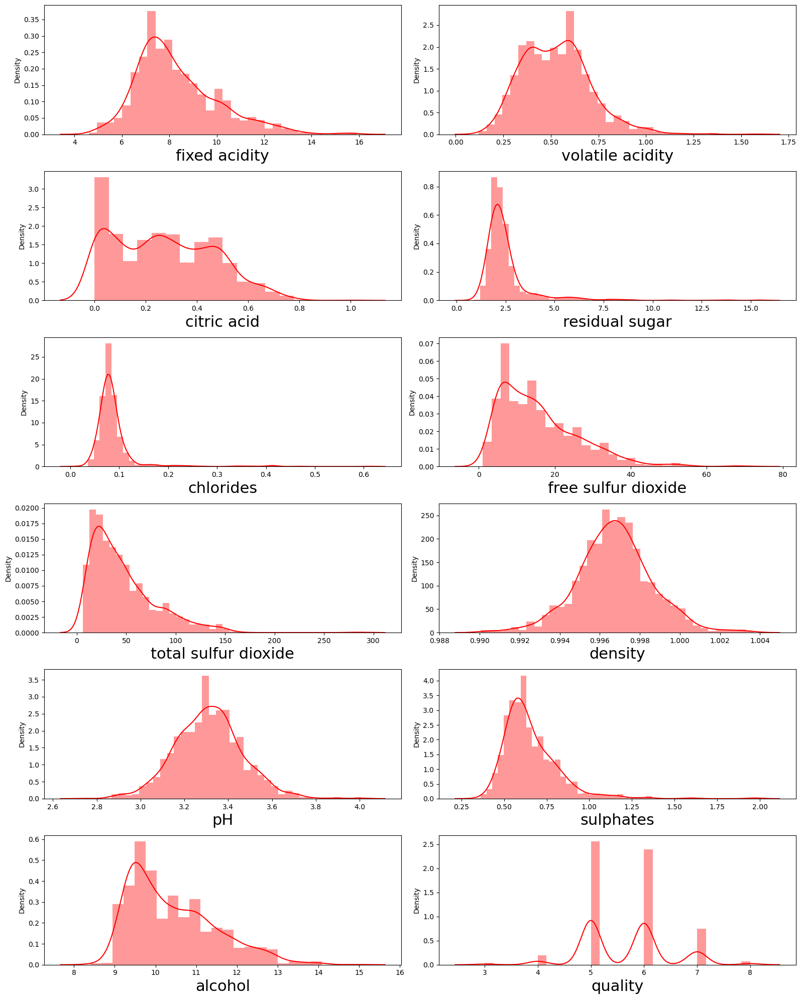

In [72]:
plt.figure(figsize=(16, 20),facecolor='white')
plotnumber = 1
for col in df.columns:
    if plotnumber <= 12:
        ax = plt.subplot(6,2,plotnumber)
        sns.distplot(df[col],color='r')
        plt.xlabel(col, fontsize=22)
        plt.yticks(rotation=0,fontsize=10)
    plotnumber += 1
plt.tight_layout()

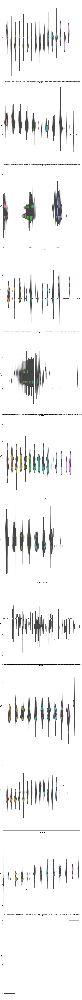

In [82]:
plt.figure(figsize=(20, 240),facecolor='white')
plotnumber = 1
for col in df.columns:
    if plotnumber <= 12:
        ax = plt.subplot(12,1,plotnumber)
#         sns.relplot(data=df, x=col, y='quality', kind="line")
        sns.violinplot(data=df,x=col,y='quality')
        plt.xlabel(col, fontsize=22)
        plt.ylabel('quality',fontsize=22)
#         plt.yticks(rotation=0,fontsize=10)
    plotnumber += 1
plt.tight_layout()

In [67]:
pairs = [(x,y) for x in df.columns for y in df.columns if x != y ]

In [78]:
df['Decision'] = df['quality'].apply(lambda x : 'Good' if x >=7 else 'Bad')

In [80]:
df.Decision.value_counts()

Decision
Bad     1382
Good     217
Name: count, dtype: int64

In [81]:
df.columns

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality', 'Decision'],
      dtype='object')

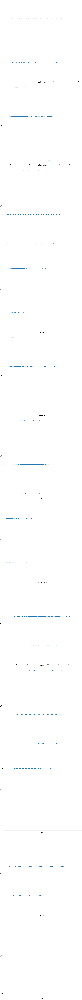

In [77]:
plt.figure(figsize=(20, 240),facecolor='white')
plotnumber = 1
for col in df.columns:
    if plotnumber <= 12:
        ax = plt.subplot(12,1,plotnumber)
#         sns.relplot(data=df, x=col, y='quality', kind="line")
        sns.scatterplot(data=df,x=col,y='quality')
        plt.xlabel(col, fontsize=22)
        plt.ylabel('quality',fontsize=22)
#         plt.yticks(rotation=0,fontsize=10)
    plotnumber += 1
plt.tight_layout()

Text(0, 0.5, 'fixed acidity')

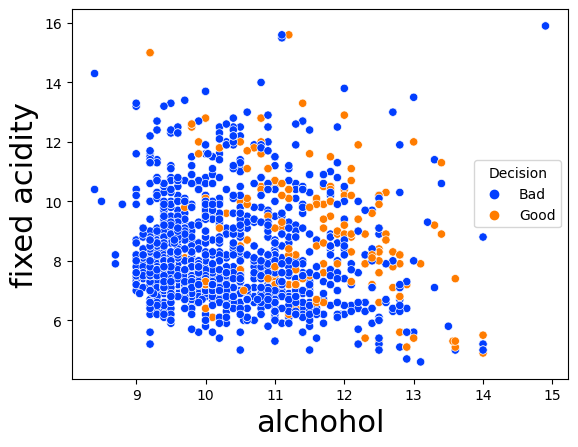

In [98]:
#sns.relplot(data=df, x=col, y='quality', kind="line")
sns.scatterplot(data=df,x='alcohol',y='fixed acidity',hue='Decision',palette='bright')
plt.xlabel('alchohol', fontsize=22)
plt.ylabel('fixed acidity',fontsize=22)
#         plt.yticks(rotation=0,fontsize=10)
# plt.tight_layout()

Fixed acidity doesn't determine dicision in relation with alchohol

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


Text(39.746312499999995, 0.5, 'fixed acidity')

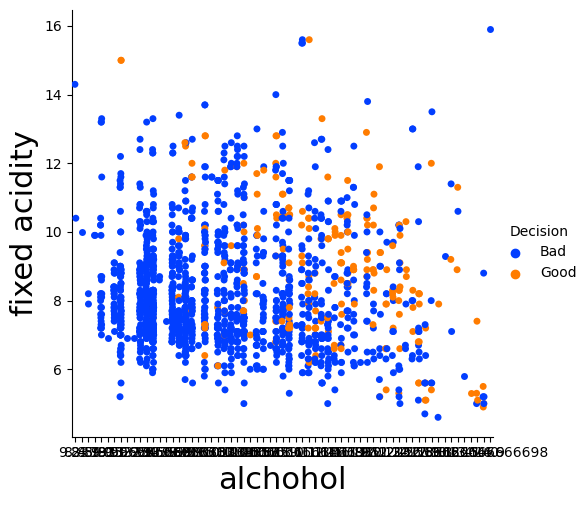

In [99]:
#sns.relplot(data=df, x=col, y='quality', kind="line")
sns.catplot(data=df,x='alcohol',y='fixed acidity',hue='Decision',palette='bright')
plt.xlabel('alchohol', fontsize=22)
plt.ylabel('fixed acidity',fontsize=22)
#         plt.yticks(rotation=0,fontsize=10)
# plt.tight_layout()

Pair plot is used to analyse multivariate analysis

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


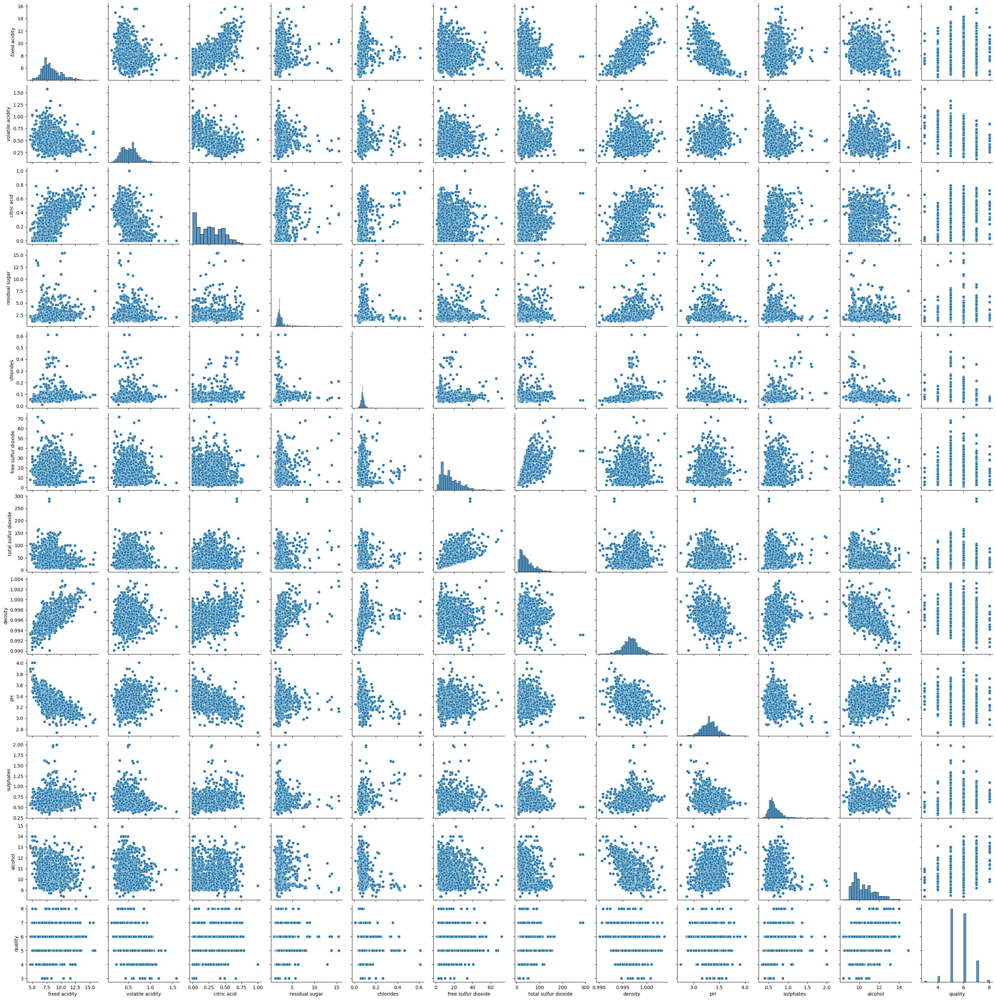

In [103]:
#sns.relplot(data=df, x=col, y='quality', kind="line")
sns.pairplot(data=df)
# plt.xlabel('alchohol', fontsize=22)
# plt.ylabel('fixed acidity',fontsize=22)
#         plt.yticks(rotation=0,fontsize=10)
# plt.tight_layout()

Checking outliers with box plot


fixed acidity
volatile acidity
citric acid
residual sugar
chlorides
free sulfur dioxide
total sulfur dioxide
density
pH
sulphates
alcohol
quality
Decision


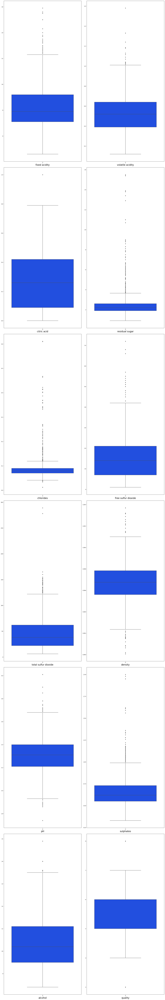

In [118]:
plt.figure(figsize=(20,200), facecolor='white')
plotnum = 1
for col in df.columns:
    print(col)
    if plotnum < len(df.columns)-1 or 'Decision' not in col:
        ax = plt.subplot(10,2,plotnum)
        sns.boxplot(df[col],palette='bright')
        plt.xlabel(col,fontsize=20)
        plt.yticks(rotation=0,fontsize=10)
    plotnum +=1
plt.tight_layout()

A lot of data from most columns seems to be outliers. Need to handle those outliers

In [120]:
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OrdinalEncoder


In [121]:
OE = OrdinalEncoder()

In [4]:
from imblearn.over_sampling import SMOTE

We now need to oversample the data since we have very less number of results for good quality samples. We will use imblearn for the same

In [ ]:
y = df['quality']
df.drop(columns=['quality'],inplace=True)
X = df

In [26]:
y

0       5
1       5
2       5
3       6
4       5
       ..
1594    5
1595    6
1596    6
1597    5
1598    6
Name: quality, Length: 1599, dtype: int64

In [25]:
X

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2


In [38]:
y = y.apply(lambda x : 'Good' if x >= 7 else 'Bad')

In [40]:
y.value_counts()

quality
Bad     1382
Good     217
Name: count, dtype: int64

In [41]:
smote = SMOTE()
x_resampled,y_resampled = smote.fit_resample(X,y)

In [42]:
x_resampled

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.400000,0.700000,0.000000,1.900000,0.076000,11.000000,34.000000,0.997800,3.510000,0.560000,9.400000
1,7.800000,0.880000,0.000000,2.600000,0.098000,25.000000,67.000000,0.996800,3.200000,0.680000,9.800000
2,7.800000,0.760000,0.040000,2.300000,0.092000,15.000000,54.000000,0.997000,3.260000,0.650000,9.800000
3,11.200000,0.280000,0.560000,1.900000,0.075000,17.000000,60.000000,0.998000,3.160000,0.580000,9.800000
4,7.400000,0.700000,0.000000,1.900000,0.076000,11.000000,34.000000,0.997800,3.510000,0.560000,9.400000
...,...,...,...,...,...,...,...,...,...,...,...
2759,12.768493,0.301575,0.736849,2.536986,0.091377,8.527393,28.157536,0.999290,3.149589,0.777877,10.642464
2760,8.182830,0.423080,0.257450,2.101769,0.080154,12.000000,18.603537,0.994871,3.211363,0.650531,11.284598
2761,10.400000,0.306819,0.586213,2.542431,0.081682,5.257569,21.742431,0.999233,3.257424,0.812119,11.096972
2762,11.164305,0.366123,0.570461,2.761230,0.088822,11.701538,30.298462,0.998570,3.224769,0.698646,11.158155


In [43]:
y_resampled.value_counts()

quality
Bad     1382
Good    1382
Name: count, dtype: int64

Now we can see that the data is resampled and eveything looks almost even. Now we can check the pair plots for multivariate analysis again

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


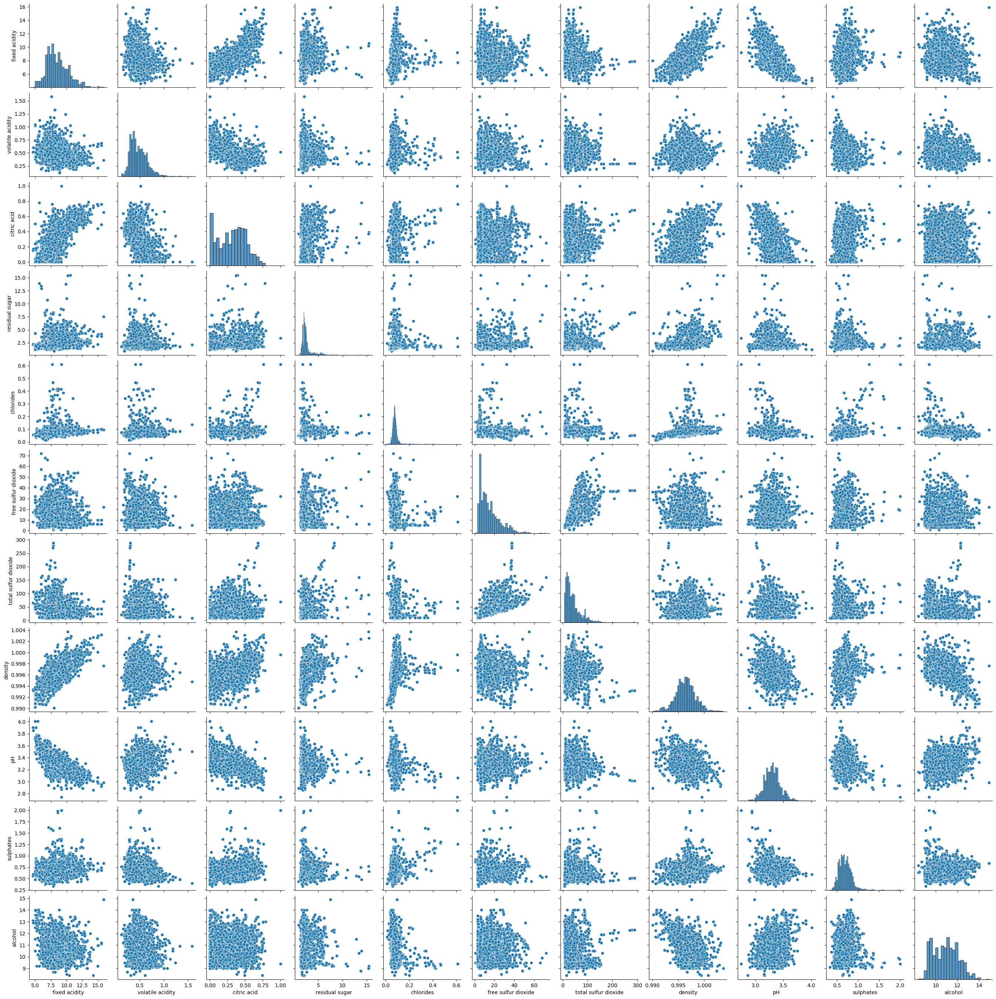

In [44]:
#sns.relplot(data=df, x=col, y='quality', kind="line")
sns.pairplot(data=x_resampled)
# plt.xlabel('alchohol', fontsize=22)
# plt.ylabel('fixed acidity',fontsize=22)
#         plt.yticks(rotation=0,fontsize=10)
# plt.tight_layout()

In [47]:
x_resampled.skew()

fixed acidity           0.684968
volatile acidity        0.894077
citric acid             0.000976
residual sugar          3.887374
chlorides               6.230380
free sulfur dioxide     1.339884
total sulfur dioxide    2.195975
density                 0.079939
pH                      0.312592
sulphates               1.633885
alcohol                 0.255874
dtype: float64

Above we can observe that there is a lot of skewness in the data. We need to remove skewness

C:\Users\LEELA DURGA PRASAD\AppData\Local\Temp\ipykernel_19576\4202794150.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x_resampled['chlorides'],kde_kws={'shade':True},hist=False)
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\distributions.py:2511: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  kdeplot(**{axis: a}, ax=ax, color=kde_color, **kde_kws)


<Axes: xlabel='chlorides', ylabel='Density'>

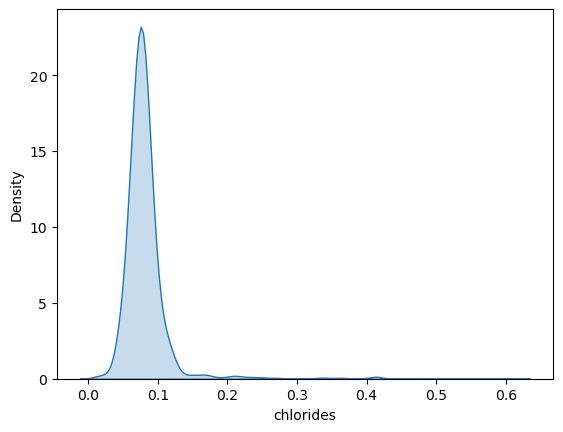

In [48]:
sns.distplot(x_resampled['chlorides'],kde_kws={'shade':True},hist=False)

In [54]:
df.skew()

fixed acidity           0.982751
volatile acidity        0.671593
citric acid             0.318337
residual sugar          4.540655
chlorides               5.680347
free sulfur dioxide     1.250567
total sulfur dioxide    1.515531
density                 0.071288
pH                      0.193683
sulphates               2.428672
alcohol                 0.860829
dtype: float64

In [53]:
df.corr()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
fixed acidity,1.000000,-0.256131,0.671703,0.114777,0.093705,-0.153794,-0.113181,0.668047,-0.682978,0.183006,-0.061668
volatile acidity,-0.256131,1.000000,-0.552496,0.001918,0.061298,-0.010504,0.076470,0.022026,0.234937,-0.260987,-0.202288
citric acid,0.671703,-0.552496,1.000000,0.143577,0.203823,-0.060978,0.035533,0.364947,-0.541904,0.312770,0.109903
residual sugar,0.114777,0.001918,0.143577,1.000000,0.055610,0.187049,0.203028,0.355283,-0.085652,0.005527,0.042075
chlorides,0.093705,0.061298,0.203823,0.055610,1.000000,0.005562,0.047400,0.200632,-0.265026,0.371260,-0.221141
free sulfur dioxide,-0.153794,-0.010504,-0.060978,0.187049,0.005562,1.000000,0.667666,-0.021946,0.070377,0.051658,-0.069408
total sulfur dioxide,-0.113181,0.076470,0.035533,0.203028,0.047400,0.667666,1.000000,0.071269,-0.066495,0.042947,-0.205654
density,0.668047,0.022026,0.364947,0.355283,0.200632,-0.021946,0.071269,1.000000,-0.341699,0.148506,-0.496180
pH,-0.682978,0.234937,-0.541904,-0.085652,-0.265026,0.070377,-0.066495,-0.341699,1.000000,-0.196648,0.205633
sulphates,0.183006,-0.260987,0.312770,0.005527,0.371260,0.051658,0.042947,0.148506,-0.196648,1.000000,0.093595


In [74]:
df['Target'] = df['quality'].apply(lambda x : 1 if x >=7 else 0)

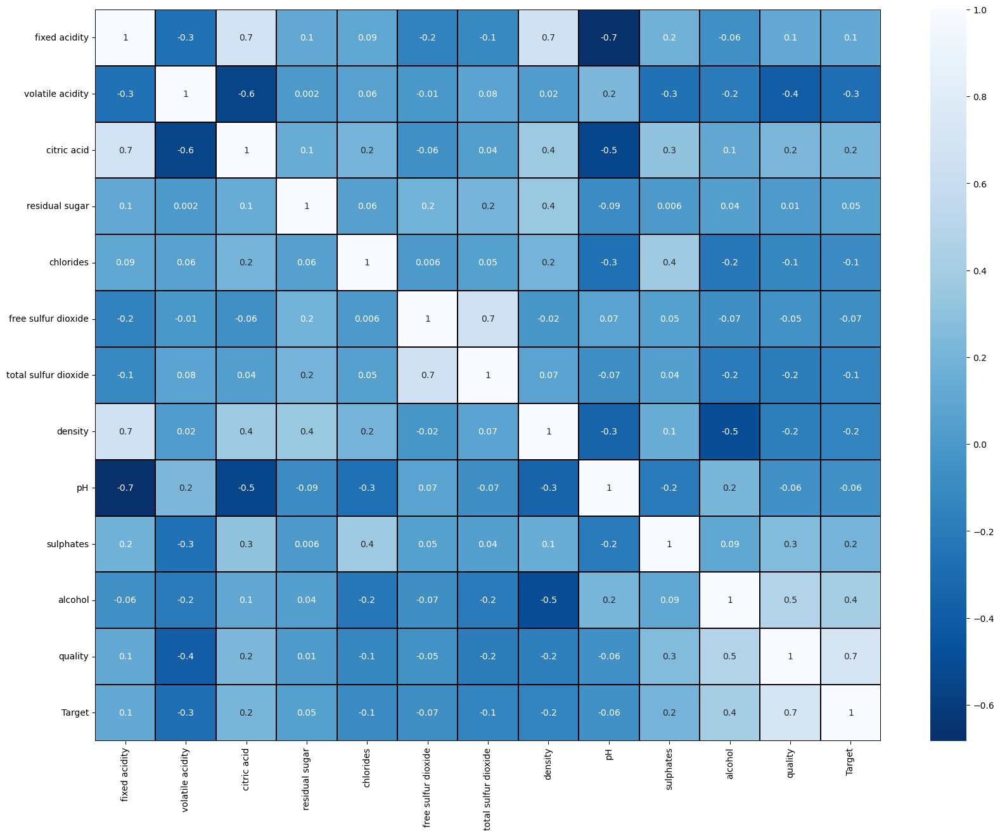

In [76]:
plt.figure(figsize=(20,15))
sns.heatmap(df.corr(),cmap='Blues_r',linewidths=0.1,fmt='.1g',linecolor='black',annot=True)
plt.yticks(rotation=0)
plt.show()

Text(0, 0.5, 'Target')

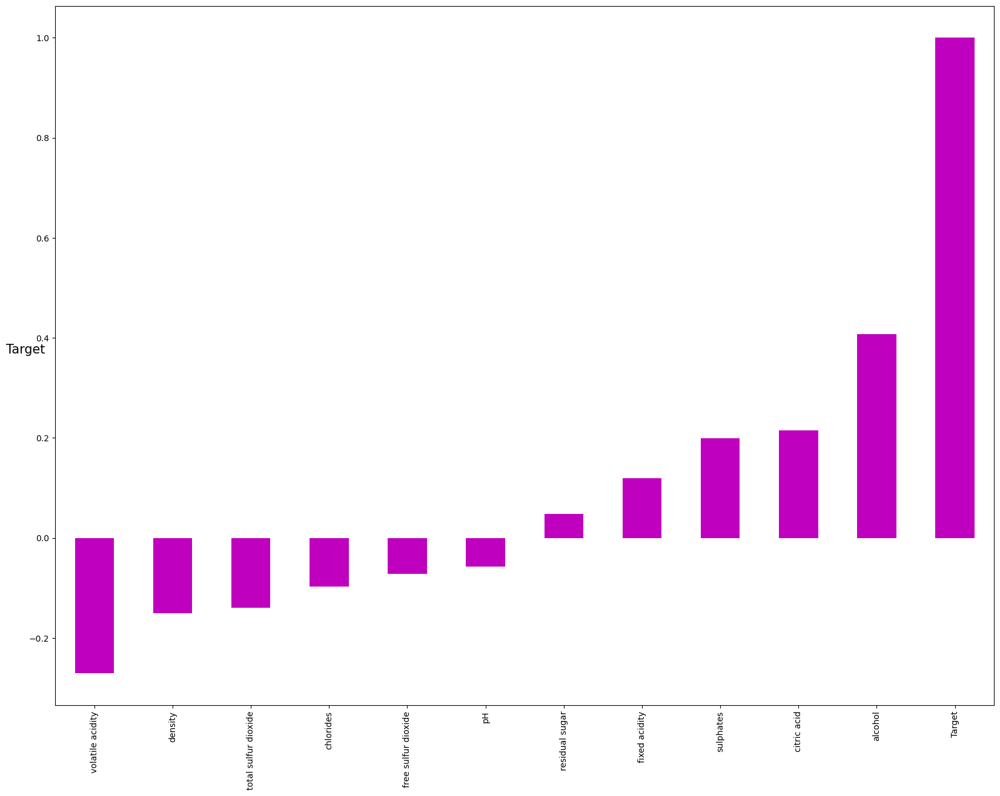

In [81]:
plt.figure(figsize=(20,15))
df.corr()['Target'].sort_values(ascending=True).drop('quality').plot(kind='bar',color='m')
plt.ylabel('Target',rotation=0,fontsize=15)

In [82]:
scaler = StandardScaler()

In [83]:
x = df.drop('Target',axis=1)
y = df['Target']

In [85]:
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,Target
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,0
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5,0
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5,0
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6,0
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5,0
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6,0
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6,0
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5,0


In [84]:
x = pd.DataFrame(scaler.fit_transform(x),columns=x.columns)
x

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,-0.528360,0.961877,-1.391472,-0.453218,-0.243707,-0.466193,-0.379133,0.558274,1.288643,-0.579207,-0.960246,-0.787823
1,-0.298547,1.967442,-1.391472,0.043416,0.223875,0.872638,0.624363,0.028261,-0.719933,0.128950,-0.584777,-0.787823
2,-0.298547,1.297065,-1.186070,-0.169427,0.096353,-0.083669,0.229047,0.134264,-0.331177,-0.048089,-0.584777,-0.787823
3,1.654856,-1.384443,1.484154,-0.453218,-0.264960,0.107592,0.411500,0.664277,-0.979104,-0.461180,-0.584777,0.450848
4,-0.528360,0.961877,-1.391472,-0.453218,-0.243707,-0.466193,-0.379133,0.558274,1.288643,-0.579207,-0.960246,-0.787823
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,-1.217796,0.403229,-0.980669,-0.382271,0.053845,1.542054,-0.075043,-0.978765,0.899886,-0.461180,0.072294,-0.787823
1595,-1.390155,0.123905,-0.877968,-0.240375,-0.541259,2.211469,0.137820,-0.862162,1.353436,0.601055,0.729364,0.450848
1596,-1.160343,-0.099554,-0.723916,-0.169427,-0.243707,1.255161,-0.196679,-0.533554,0.705508,0.542042,0.541630,0.450848
1597,-1.390155,0.654620,-0.775267,-0.382271,-0.264960,1.542054,-0.075043,-0.676657,1.677400,0.305990,-0.209308,-0.787823


we have standardised the data to avoid bias. Now we need to check for multicollenearity

# Checking variance inflation factor (VIF)

In [87]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif['values'] = [variance_inflation_factor(x.values,i) for i in range(len(x.columns))] 
vif['features'] = x.columns

vif

,values,features
0,7.772051,fixed acidity
1,1.879663,volatile acidity
2,3.131055,citric acid
3,1.703859,residual sugar
4,1.500591,chlorides
5,1.968010,free sulfur dioxide
6,2.214467,total sulfur dioxide
7,6.346491,density
8,3.339511,pH
9,1.487286,sulphates


We are removing fixed acidity since vif value is too high for that. so that we can reduce multi collenearity

In [89]:
x = x.drop('fixed acidity',axis=1)

In [90]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif['values'] = [variance_inflation_factor(x.values,i) for i in range(len(x.columns))] 
vif['features'] = x.columns

vif

,values,features
0,1.874221,volatile acidity
1,2.782222,citric acid
2,1.386862,residual sugar
3,1.421802,chlorides
4,1.944737,free sulfur dioxide
5,2.099856,total sulfur dioxide
6,2.430116,density
7,1.627819,pH
8,1.452106,sulphates
9,2.365045,alcohol


Now we can see that there is not much collenearity in data

In [92]:
y.value_counts()

Target
0    1382
1     217
Name: count, dtype: int64

In [128]:
smote = SMOTE()
x1,y1 = smote.fit_resample(x,y)

In [129]:
y1.value_counts()

Target
0    1382
1    1382
Name: count, dtype: int64

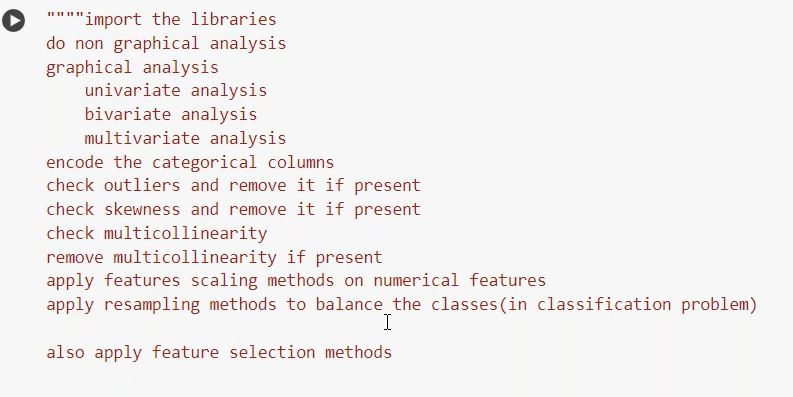

In [120]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

maxAcc = 0
maxRS = 0
for i in range(200):
    x_train, x_test, y_train, y_test = train_test_split(x1, y1, test_size=0.30, random_state=i)
    RFR = RandomForestClassifier(random_state=0)
    RFR.fit(x_train, y_train)
    pred = RFR.predict(x_test)
    acc = accuracy_score(y_test, pred)
    if acc > maxAcc:
        maxAcc = acc
        maxRS = i
print("Best accuracy is", maxAcc, "at random state", maxRS)


Best accuracy is 1.0 at random state 0


Seems to be data is overfit

In [110]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [137]:
# checking accuracy for LogisticRegression
LR = LogisticRegression()

maxAcc = 0
maxRS = 0
for i in range(200):
    x_train, x_test, y_train, y_test = train_test_split(x1, y1, test_size=0.30, random_state=i)
    LR.fit(x_train, y_train)
    pred = LR.predict(x_test)
    acc = accuracy_score(y_test, pred)
    if acc > maxAcc:
        maxAcc = acc
        maxRS = i
print("Best accuracy is", maxAcc, "at random state", maxRS)


Best accuracy is 1.0 at random state 0


In [138]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

gb_clf = GradientBoostingClassifier(n_estimators=100, learning_rate=1.0, max_depth=1, random_state=42)

maxAcc = 0
maxRS = 0
for i in range(200):
    x_train, x_test, y_train, y_test = train_test_split(x1, y1, test_size=0.30, random_state=i)
    gb_clf.fit(x_train, y_train)
    pred = gb_clf.predict(x_test)
    acc = accuracy_score(y_test, pred)
    if acc > maxAcc:
        maxAcc = acc
        maxRS = i
print("Best accuracy is", maxAcc, "at random state", maxRS)



Best accuracy is 1.0 at random state 0


In [139]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

abc = AdaBoostClassifier(n_estimators=50, learning_rate=1)

maxAcc = 0
maxRS = 0
for i in range(200):
    x_train, x_test, y_train, y_test = train_test_split(x1, y1, test_size=0.30, random_state=i)
    abc.fit(x_train, y_train)
    pred = abc.predict(x_test)
    acc = accuracy_score(y_test, pred)
    if acc > maxAcc:
        maxAcc = acc
        maxRS = i
print("Best accuracy is", maxAcc, "at random state", maxRS)


Best accuracy is 1.0 at random state 0


In [140]:
from sklearn.ensemble import BaggingClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

bc = BaggingClassifier(n_estimators=50, random_state=42)


maxAcc = 0
maxRS = 0
for i in range(200):
    x_train, x_test, y_train, y_test = train_test_split(x1, y1, test_size=0.30, random_state=i)
    bc.fit(x_train, y_train)
    pred = bc.predict(x_test)
    acc = accuracy_score(y_test, pred)
    if acc > maxAcc:
        maxAcc = acc
        maxRS = i
print("Best accuracy is", maxAcc, "at random state", maxRS)

Best accuracy is 1.0 at random state 0


In [141]:
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

clf = ExtraTreesClassifier(n_estimators=100, criterion='gini', max_depth=None, min_samples_split=2)


maxAcc = 0
maxRS = 0
for i in range(200):
    x_train, x_test, y_train, y_test = train_test_split(x1, y1, test_size=0.30, random_state=i)
    clf.fit(x_train, y_train)
    pred = clf.predict(x_test)
    acc = accuracy_score(y_test, pred)
    if acc > maxAcc:
        maxAcc = acc
        maxRS = i
print("Best accuracy is", maxAcc, "at random state", maxRS)

Best accuracy is 1.0 at random state 0


All the algorithms seems to predict good. We are good to take any algorithm.